# Cycling data: maps, strava segments, training and wind data

N.B. for the last part of this notebook you will need an account/api key for openweather.org.

## To do:
- [ ] convert points to polyline (https://deparkes.co.uk/2016/06/03/plot-lines-in-folium/)
- [ ] polyline/points different colors based on value (https://stackoverflow.com/questions/42756934/how-to-plot-lat-and-long-from-pandas-dataframe-on-folium-map-group-by-some-label)
- [ ] create midpoint out of a group of points to centralize the map
- [ ] also to find start/endpoint based on given point
- [ ] show segment in table + on map


## 0. Install fitparse and import the python libraries

We use the fitparse library to parse the .fit file.

Please find the github of fitparse project here: http://dtcooper.github.io/python-fitparse/

In [1]:
#!pip install fitparse 

In [2]:
#import the modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import fitparse

## 1a. import the .fit file and read it into pandas dataframe


In [1]:
# parse the fit file and read it into a list called workout
#source: http://johannesjacob.com/
from fitparse import FitFile
import pandas as pd
import matplotlib.pyplot as plt

fitfile = FitFile('3919172E.fit') ### enter the name of the file here!

while True:
    try:
        fitfile.messages
        break
    except KeyError:
        continue
workout = []
for record in fitfile.get_messages('record'):
    r = {}
    for record_data in record:
        r[record_data.name] = record_data.value
    workout.append(r)


In [2]:
#read this list into a pandas dataframe
fietsdata = pd.DataFrame(workout)
fietsdata.head()

,accumulated_power,altitude,cadence,calories,distance,enhanced_altitude,enhanced_speed,grade,heart_rate,left_pedal_smoothness,left_right_balance,left_torque_effectiveness,position_lat,position_long,power,right_pedal_smoothness,right_torque_effectiveness,speed,temperature,timestamp
0,9241.0,3040.0,64.0,0,0.0,108.0,5.926,None,115,None,None,None,624663697.0,57981701.0,111.0,None,None,5926,23,2020-05-09 08:00:47
1,9370.0,3040.0,65.0,0,12.0,108.0,6.471,None,117,None,None,None,624663458.0,57980727.0,129.0,None,None,6471,23,2020-05-09 08:00:48
2,9370.0,3035.0,65.0,0,12.0,107.0,6.327,None,119,None,None,None,624663200.0,57979693.0,112.0,None,None,6327,23,2020-05-09 08:00:49
3,9482.0,3035.0,65.0,0,24.0,107.0,6.214,None,120,None,None,None,624662921.0,57978719.0,132.0,None,None,6214,23,2020-05-09 08:00:50
4,9674.0,3030.0,66.0,1,24.0,106.0,6.049,None,121,None,None,None,624662723.0,57977665.0,60.0,None,None,6049,23,2020-05-09 08:00:51


## 2. Data cleaning

In [3]:
fietsdata.dtypes

accumulated_power                    float64
altitude                             float64
cadence                              float64
calories                               int64
distance                             float64
enhanced_altitude                    float64
enhanced_speed                       float64
grade                                 object
heart_rate                             int64
left_pedal_smoothness                 object
left_right_balance                    object
left_torque_effectiveness             object
position_lat                         float64
position_long                        float64
power                                float64
right_pedal_smoothness                object
right_torque_effectiveness            object
speed                                  int64
temperature                            int64
timestamp                     datetime64[ns]
dtype: object

In [4]:
# convert m/s to km/h
# * 3600s/ 1000 = 3.6
fietsdata['speed_kmh'] = fietsdata['enhanced_speed'] *3.6
fietsdata.head() # check new column speed_kmh at right

,accumulated_power,altitude,cadence,calories,distance,enhanced_altitude,enhanced_speed,grade,heart_rate,left_pedal_smoothness,...,left_torque_effectiveness,position_lat,position_long,power,right_pedal_smoothness,right_torque_effectiveness,speed,temperature,timestamp,speed_kmh
0,9241.0,3040.0,64.0,0,0.0,108.0,5.926,None,115,None,...,None,624663697.0,57981701.0,111.0,None,None,5926,23,2020-05-09 08:00:47,21.3336
1,9370.0,3040.0,65.0,0,12.0,108.0,6.471,None,117,None,...,None,624663458.0,57980727.0,129.0,None,None,6471,23,2020-05-09 08:00:48,23.2956
2,9370.0,3035.0,65.0,0,12.0,107.0,6.327,None,119,None,...,None,624663200.0,57979693.0,112.0,None,None,6327,23,2020-05-09 08:00:49,22.7772
3,9482.0,3035.0,65.0,0,24.0,107.0,6.214,None,120,None,...,None,624662921.0,57978719.0,132.0,None,None,6214,23,2020-05-09 08:00:50,22.3704
4,9674.0,3030.0,66.0,1,24.0,106.0,6.049,None,121,None,...,None,624662723.0,57977665.0,60.0,None,None,6049,23,2020-05-09 08:00:51,21.7764


In [5]:
#Convert position_long and position_lat to degrees instead of semicircles
fietsdata['pos_lat'] = fietsdata['position_lat']*  (180 / 2**31)
fietsdata['pos_long'] = fietsdata['position_long']*  (180 / 2**31)
fietsdata.head()

,accumulated_power,altitude,cadence,calories,distance,enhanced_altitude,enhanced_speed,grade,heart_rate,left_pedal_smoothness,...,position_long,power,right_pedal_smoothness,right_torque_effectiveness,speed,temperature,timestamp,speed_kmh,pos_lat,pos_long
0,9241.0,3040.0,64.0,0,0.0,108.0,5.926,None,115,None,...,57981701.0,111.0,None,None,5926,23,2020-05-09 08:00:47,21.3336,52.358706,4.859970
1,9370.0,3040.0,65.0,0,12.0,108.0,6.471,None,117,None,...,57980727.0,129.0,None,None,6471,23,2020-05-09 08:00:48,23.2956,52.358686,4.859888
2,9370.0,3035.0,65.0,0,12.0,107.0,6.327,None,119,None,...,57979693.0,112.0,None,None,6327,23,2020-05-09 08:00:49,22.7772,52.358665,4.859802
3,9482.0,3035.0,65.0,0,24.0,107.0,6.214,None,120,None,...,57978719.0,132.0,None,None,6214,23,2020-05-09 08:00:50,22.3704,52.358641,4.859720
4,9674.0,3030.0,66.0,1,24.0,106.0,6.049,None,121,None,...,57977665.0,60.0,None,None,6049,23,2020-05-09 08:00:51,21.7764,52.358625,4.859632


## 3.Personalisation

In [8]:
# Enter: 
# weight
# age
# vo2 max
# max heart rate 
# aerobic treshold

### 3a. Heart rate zones

In [6]:
# Enter aerobic treshold (at)
at= int(input("Enter your aerobic treshold : "))
d1_lower = int(at * 0.7)
d2_lower = int(at * 0.8)
d3_lower = int(at * 0.9)

print("Your heart rate zones are:")
print("d0 < " +str(d1_lower))
print('d1 = '+ str(d1_lower)+ ' - '+str(d2_lower))
print('d2 = '+ str(d2_lower)+ ' - '+str(d3_lower))
print('d3 = '+ str(d3_lower)+ ' - '+str(at))
print('at = '+ str(at))
print("at+ > " +str(at))

Enter your aerobic treshold : 172
Your heart rate zones are:
d0 < 120
d1 = 120 - 137
d2 = 137 - 154
d3 = 154 - 172
at = 172
at+ > 172


In [7]:
# add a new column to the datafield containing the heart rate zones
fietsdata['hr_zone'] = pd.cut(fietsdata.heart_rate, bins=[0, d1_lower,d2_lower,d3_lower,at, 220], labels=['d0', 'd1', 'd2','d3', 'at+'])
fietsdata.hr_zone

0        d0
1        d0
2        d0
3        d0
4        d1
         ..
14906    d1
14907    d1
14908    d1
14909    d1
14910    d1
Name: hr_zone, Length: 14911, dtype: category
Categories (5, object): [d0 < d1 < d2 < d3 < at+]

In [8]:
#check to see the new dtype category for hr_zone
fietsdata.dtypes

accumulated_power                    float64
altitude                             float64
cadence                              float64
calories                               int64
distance                             float64
enhanced_altitude                    float64
enhanced_speed                       float64
grade                                 object
heart_rate                             int64
left_pedal_smoothness                 object
left_right_balance                    object
left_torque_effectiveness             object
position_lat                         float64
position_long                        float64
power                                float64
right_pedal_smoothness                object
right_torque_effectiveness            object
speed                                  int64
temperature                            int64
timestamp                     datetime64[ns]
speed_kmh                            float64
pos_lat                              float64
pos_long  

In [9]:
#create a new dataframe 'zones' with heart rate data
counts = fietsdata.hr_zone.value_counts()
per    = fietsdata.hr_zone.value_counts(normalize=True).round(3)
percent100 = fietsdata.hr_zone.value_counts(normalize=True).mul(100).round(1).astype(str)+'%'
zones = pd.DataFrame({'counts': counts, 'fraction': per, 'percentage': percent100})
zones

,counts,fraction,percentage
d2,9922,0.665,66.5%
d3,4190,0.281,28.1%
d1,678,0.045,4.5%
d0,121,0.008,0.8%
at+,0,0.000,0.0%


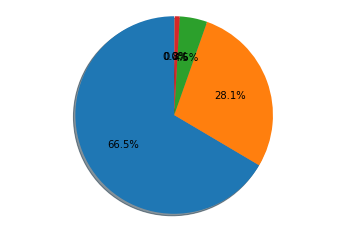

In [10]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
#labels = 'd2', 'd1', 'd3', 'd3', 'at+' TO DO CREATE LABELS or LEGEND
sizes = fietsdata.hr_zone.value_counts(normalize=True).round(3)
#explode = (0, 0.1, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig1, ax1 = plt.subplots()
ax1.pie(sizes, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()
# SHOW LEGEND

## 4. Show data in graphs

### 4a. Calories burned

There are many ways to calculate the calories burned. Here we use data from the power meter.

### 4b. Speed and heart rate

### 4c. Cadence and Power

### 4d. Histogram of cadence, bpm and power

## 5. Show data on map

### 5a. Use folium to create a base map

In [11]:
import folium

fietskaart = folium.Map(location=[52.373,4.890],
                  tiles='Stamen Terrain',
                  zoom_start=10, detect_retina=True)

fietskaart

### 5b. Remove all unnecessary data; just keep the lat, long.

In [12]:
columns = fietsdata.columns
columns

Index(['accumulated_power', 'altitude', 'cadence', 'calories', 'distance',
       'enhanced_altitude', 'enhanced_speed', 'grade', 'heart_rate',
       'left_pedal_smoothness', 'left_right_balance',
       'left_torque_effectiveness', 'position_lat', 'position_long', 'power',
       'right_pedal_smoothness', 'right_torque_effectiveness', 'speed',
       'temperature', 'timestamp', 'speed_kmh', 'pos_lat', 'pos_long',
       'hr_zone'],
      dtype='object')

In [21]:
coor = fietsdata.drop(['accumulated_power', 'altitude', 'cadence', 'calories', 'distance',
       'enhanced_altitude', 'enhanced_speed', 'grade', 'heart_rate',
       'left_pedal_smoothness', 'left_right_balance',
       'left_torque_effectiveness', 'position_lat', 'position_long', 'power',
       'right_pedal_smoothness', 'right_torque_effectiveness', 'speed',
       'temperature', 'timestamp', 'speed_kmh', 'hr_zone'], axis=1) # drop NaN
coor = coor[coor.pos_lat != 'None'] # drop None
coor_valid = coor.dropna()
coor_valid

,pos_lat,pos_long
0,52.358706,4.859970
1,52.358686,4.859888
2,52.358665,4.859802
3,52.358641,4.859720
4,52.358625,4.859632
...,...,...
14906,52.359196,4.861780
14907,52.359190,4.861783
14908,52.359188,4.861792
14909,52.359188,4.861797


### 5c. Plot the coordinates on the map

In [22]:
import folium

coor_valid.apply(lambda row:folium.Circle(radius=10, location=[row["pos_lat"], 
                                                  row["pos_long"]]).add_to(fietskaart),
                axis=1)
fietskaart.add_child(folium.LatLngPopup())
fietskaart

In [ ]:
# plot map with different colors for speed


In [18]:
fietskaart.save('fietskaart.html') # save the map as an html file

## Segments 

Use the map above to select a start point and endpoint close to your route.

Code: 
Input:
-  enter start point Latitude: 52.3559 Longitude: 4.9681
-  enter last point Latitude: 52.3570 Longitude: 4.9706

Logic:
- find nearest points on route based on point class example for start/end points

Return
- Return data for this segment:
    - time, speed, heart_rate, power, cadence
- show in graph


In [ ]:
# Input: ask the user to specify the segment.

segment_name = input("Enter name of segment")

startpoint_lat = float(input("Enter lat of startpoint"))
startpoint_long = float(input("Enter long of startpoint"))

endpoint_lat = float(input("Enter lat of startpoint"))
endpoint_long = float(input("Enter long of end point"))

print(segment_name)
print("startpoint="+ str(startpoint_lat) +str(startpoint_long))
print("endpoint=" + str(endpoint_lat) + str(endpoint_long))



## 6. Get the current weather data and wind data

Source and more information: https://openweathermap.org/current#geo

You will need an API-key for this website.

In [2]:
#get the startpoint of the ride. (=first lat and long) 
lat1 = fietsdata.lat.iloc[0] 
long1 = fietsdata.long.iloc[0]

#convert the dtype float64 datatype to an integer for step 5
lon_str = f'{long1}'
lat_str = f'{lat1}'
type(lat_str)

NameError: name 'fietsdata' is not defined

In [1]:
#see my Jupyter notebook on importing weather data from openweather.org

import requests
from pprint import pprint

##API key and base_url
#api.openweathe={lat}&lon={lon}&appid={your api key}rmap.org/data/2.5/weather?lat
API_key = "ac37f4337bdc07b0642d027ee1313660"

# This stores the base url
base_url = "http://api.openweathermap.org/data/2.5/weather?"

###get the coordinates of the first datapoint####

lat= lat_str #"52.1" #deze variabele moet een string zijn.
lon= lon_str #"4.862"

# This is final url. This is concatenation of base_url, API_key and city_id
Final_url = base_url + "lat=" + lat +"&lon=" + lon  + "&appid=" + API_key 
print(Final_url)
# this variable contain the JSON data which the API returns
weather_data = requests.get(Final_url).json()

# JSON data is difficult to visualize, so you need to pretty print 
#pprint(weather_data)
wind_dir = weather_data['wind']['deg'] 
wind_speed =weather_data['wind']['speed']
print(round(wind_speed,1)), print("m/s")
print(round(wind_dir,1))

#http://api.openweathermap.org/data/2.5/weather?lat=52&lon=4&appid=ac37f4337bdc07b0642d027ee1313660

NameError: name 'lat_str' is not defined

## 7. Combine ride and weather data


In [ ]:
To do